# Data Preparation

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
from zipfile import ZipFile
file_name = "/content/drive/MyDrive/1. iNeuron Intelligence Pvt Ltd/Domains/1. Health Care/1. BMI using Human Face Image/Data Set/facial_images.zip"
with ZipFile(file_name, 'r') as zip:
  zip.extractall()
  print("File extracted!")

File extracted!


In [35]:
from zipfile import ZipFile
file_name = "/content/drive/MyDrive/1. iNeuron Intelligence Pvt Ltd/Domains/1. Health Care/1. BMI using Human Face Image/Data Set/face_aligned.zip"
with ZipFile(file_name, 'r') as zip:
  zip.extractall()
  print("File extracted!")

File extracted!


**Importing nesseary libraries**

In [4]:
import pandas as pd
import os
import re
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline

**Loading original data before clean**

In [5]:
data = pd.read_csv('/content/drive/MyDrive/1. iNeuron Intelligence Pvt Ltd/Domains/1. Health Care/1. BMI using Human Face Image/Data Set/full.csv')
data.head()

,nameid,name,book_date,city,holding_location,age,height,weight,race,sex,eyes,hair,bookid
0,7482,JAMES DEYO ROBINSON,3/10/2017 10:05:55 AM,"WAUKEE, IA",PCJ,54,"5' 11""",280,Black,Male,Brown,Black,248038
1,754952,CORDERRO ALTON LAURENCE,4/23/2017 8:57:43 AM,"DES MOINES, IA",Cherokee Mental Health,26,"5' 11""",210,Black,Male,Brown,Black,250464
2,644421,TAYLOR LOUIS HARLAN,12/7/2017 4:00:07 PM,"DES MOINES, IA",PCJ,24,"5' 09""",290,White,Male,Green,Blonde,263711
3,699804,MALIK TYRONE MANDUJANO,4/1/2018 3:24:44 AM,"DES MOINES, IA",PCJ,21,"5' 03""",130,Black,Male,Brown,Black,270020
4,238047,DUSTIN GLEN BLACK,8/5/2018 9:26:54 PM,"DES MOINES, IA",PCJ,29,"6' 02""",230,White,Male,Blue,Blonde,277774


**Regex to extract feet and inches from height**

In [6]:
regex_feet = re.compile("([0-9]+)\'")
regex_inches = re.compile("([0-9]+)\"")

def extract_numbers(x, regex):
    captures = regex.findall(x)
    if len(captures) > 0:
        try:
            return int(captures[0])
        except:
            return None
    else:
        return None

# parse the height string to feet and inches
data['feet'] = data['height'].map(lambda i: extract_numbers(i, regex_feet))
data['inches'] = data['height'].map(lambda i: extract_numbers(i, regex_inches))
data.loc[data.inches > 12,:]

,nameid,name,book_date,city,holding_location,age,height,weight,race,sex,eyes,hair,bookid,feet,inches
31,1083884,CALEB CHARLES RUTAN,1/2/2019 6:27:40 AM,"DES MOINES, IA",PCJ,48,"6' 63""",200,White,Male,Brown,Gray,287593,6.0,63.0
456,912542,HUSSEIN NKUSU TAMBWE,7/4/2019 10:40:46 AM,"URBANDALE, IA",PCJ,24,"5' 57""",175,Black,Male,Brown,Black,296374,5.0,57.0
566,1169382,JULIANNE JO BECKETT,7/15/2019 4:50:55 PM,"KNOXVILLE, IA",PCJ,20,"5' 59""",350,White,Female,Hazel,Brown,296977,5.0,59.0
622,1227456,ANDREW LANTA BOYD,7/19/2019 8:11:17 AM,"DES MOINES, IA",PCJ,35,"5' 59""",0,Black,Male,Brown,Black,297206,5.0,59.0
640,877215,SIOUX HAWK HOFFNER,7/22/2019 6:51:56 PM,"DES MOINES, IA",PCJ,24,"4' 49""",90,Pacific Islander,Female,Brown,Brown,297380,4.0,49.0
671,1051124,JASON ALLAN BROWNING,7/24/2019 6:10:24 PM,"URBANDALE, IA",PCJ,41,"6' 60""",205,White,Male,Green,Brown,297503,6.0,60.0
1068,1012250,DARRYL ANTHONY HISHAW,10/6/2019 4:48:50 PM,"DES MOINES, IA",PCJ,26,"5' 56""",145,Black,Male,Brown,Black,301966,5.0,56.0
1192,1170588,KAY SAW,10/27/2019 4:21:49 PM,"DES MOINES, IA",PCJ,22,"5' 54""",120,Asian,Male,Brown,Black,303124,5.0,54.0


In [7]:
# found some incorrect inches, assume 63" to 6.3"
data['inches'] = data['inches'].map(lambda i: i / 10 if i > 12 else i)
# convert feet/inches to inches
data['height'] = data.apply(lambda row: row['feet'] * 12 + row['inches'], axis=1)
# covert inches to m
data['height'] = data['height'].map(lambda i: i * 2.54 / 100)
# weight pounds => kg
data['weight'] = data['weight'].map(lambda i: i * 0.453592)
# calculate BMI = weight/height^2
data['bmi'] = data.apply(lambda row: row['weight'] / row['height'] / row['height'], axis = 1)
# create gender (number format of sex)
data['gender'] = data['sex'].map(lambda i: 1 if i == 'Male' else 0)

data[['nameid','age','height','weight','race','sex','eyes','hair', 'bmi']].head()

,nameid,age,height,weight,race,sex,eyes,hair,bmi
0,7482,54,1.8034,127.00576,Black,Male,Brown,Black,39.051641
1,754952,26,1.8034,95.25432,Black,Male,Brown,Black,29.288731
2,644421,24,1.7526,131.54168,White,Male,Green,Blonde,42.825039
3,699804,21,1.6002,58.96696,Black,Male,Brown,Black,23.028211
4,238047,29,1.8796,104.32616,White,Male,Blue,Blonde,29.529925


**Descriptive Analysis**

In [8]:
plt.rcParams["figure.figsize"] = (12, 6)
plt.rcParams["xtick.labelsize"] = 12
plt.rcParams["ytick.labelsize"] = 12
plt.rcParams["font.size"] = 12
plt.rcParams["axes.labelsize"] = 12

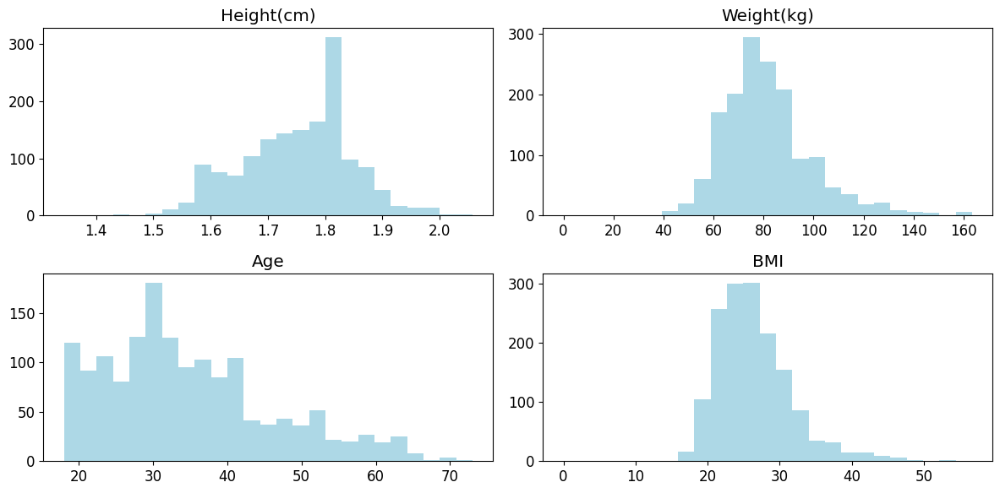

In [9]:
def ax_subplot(ax, x, title, bins = 25, color = 'lightblue'):
    x = x[~x.isnull()]
    ax.hist(x, bins = bins, color = color)
    ax.set_title(title)

fig, ax = plt.subplots(2,2)
ax_subplot(ax[0,0], data.height, 'Height(cm)')
ax_subplot(ax[0,1], data.weight, 'Weight(kg)')
ax_subplot(ax[1,0], data.age, 'Age')
ax_subplot(ax[1,1], data.bmi, 'BMI')
plt.tight_layout()
plt.show()

**BMI density by Sex**

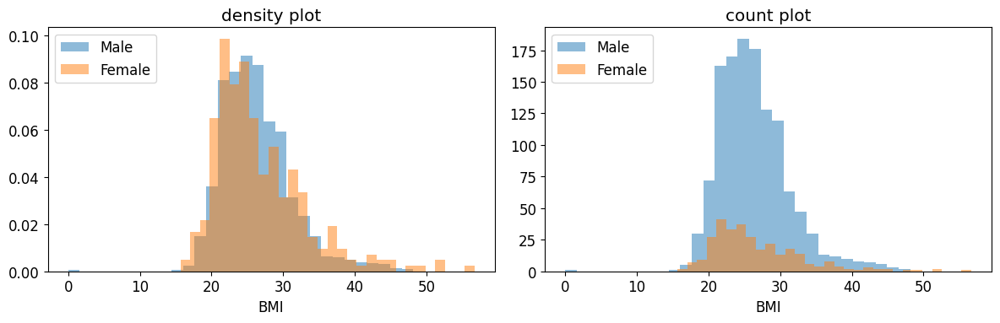

In [10]:
fig, ax = plt.subplots(1,2,sharex=True)
fig.set_size_inches(12,4)
options = {'density plot': True, 'count plot': False}

for i, (title, normed) in enumerate(options.items()):

    for sex in ['Male','Female']:
        ax[i].hist(data.loc[(data.sex == sex) & (~data.bmi.isnull()),'bmi'].values, label = sex, alpha = 0.5,
                 bins = 30, density = normed)
        ax[i].set_title(title)
        ax[i].set_xlabel('BMI')
        ax[i].legend(loc = 'upper left')

plt.tight_layout()
plt.show()

**Gender and Race Imbalance**

<Axes: xlabel='count', ylabel='race'>

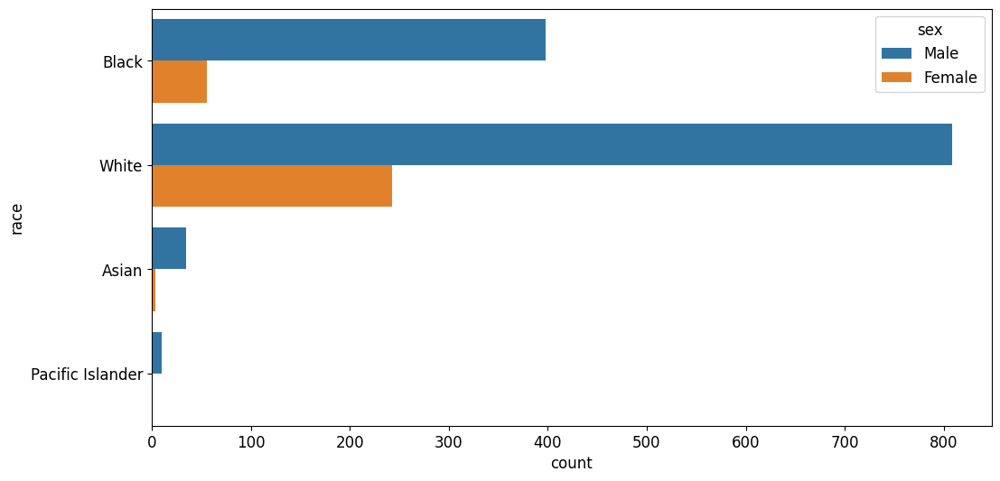

In [11]:
sns.countplot(y = 'race' ,data = data, hue = 'sex')

**Train Test split**

In [12]:
# remove rows that no face images
data['index'] = data['bookid'].map(lambda i: str(i) +'.jpg')
allimage = os.listdir('/content/face')
data = data.loc[data['index'].isin(allimage),:]

# remove rows with invalid BMI
data = data.loc[~data['bmi'].isnull(), :]

# split train/valid
in_train = np.random.random(size = len(data)) <= 0.8
train = data.loc[in_train,:]
test = data.loc[~in_train,:]

print('train data dimension: {}'.format(str(train.shape)))
print('test data dimension:  {}'.format(str(test.shape)))

# output to csv files
train.to_csv('/content/drive/MyDrive/1. iNeuron Intelligence Pvt Ltd/Domains/1. Health Care/1. BMI using Human Face Image/Data Set/train.csv', index = False)
test.to_csv('/content/drive/MyDrive/1. iNeuron Intelligence Pvt Ltd/Domains/1. Health Care/1. BMI using Human Face Image/Data Set/valid.csv', index = False)

train data dimension: (1195, 18)
test data dimension:  (348, 18)


**Installing Necessary Libraries**

In [13]:
!pip install keras_applications

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 2.9 MB/s eta 0:00:00


In [14]:
!pip install mtcnn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 13.2 MB/s eta 0:00:00


In [15]:
!pip install tensorflow

In [16]:
import cv2
import os
from mtcnn.mtcnn import MTCNN

test_dir = '/content/drive/MyDrive/1. iNeuron Intelligence Pvt Ltd/Domains/1. Health Care/1. BMI using Human Face Image/Data Set/test/single_face/'
train_dir = '/content/face'
test_processed_dir = '/content/drive/MyDrive/1. iNeuron Intelligence Pvt Ltd/Domains/1. Health Care/1. BMI using Human Face Image/Data Set/test/test_aligned/'
train_processed_dir = '/content/face_aligned'

os.listdir(test_dir)

['trump.jpg',
 'xi.jpg',
 'Kim Jong-un.jpg',
 'bill-gates.jpg',
 'albert-einstein.jpg',
 'barack-obama.jpg',
 'kent_zheng.jpg',
 'hilary_clinton.jpg',
 'emma_watson.jpg',
 'leonardo.jpeg']

In [17]:
img = cv2.cvtColor(cv2.imread(test_dir + 'trump.jpg'), cv2.COLOR_BGR2RGB)
detector = MTCNN()
print(detector.detect_faces(img))
box = detector.detect_faces(img)[0]

1/1 [==============================] - 0s 366ms/step
[{'box': [355, 75, 266, 347], 'confidence': 0.9983004927635193, 'keypoints': {'left_eye': (432, 209), 'right_eye': (551, 208), 'nose': (492, 276), 'mouth_left': (445, 346), 'mouth_right': (544, 347)}}]
1/1 [==============================] - 0s 96ms/step


In [18]:
pip install keras_vggface

In [ ]:
pip install keras.engine.topology

ERROR: Could not find a version that satisfies the requirement keras.engine.topology (from versions: none)
ERROR: No matching distribution found for keras.engine.topology


In [19]:
from keras.preprocessing import image
from keras.utils.layer_utils import get_source_inputs
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import keras.utils as image
import numpy as np
from PIL import Image

def crop_img(im,x,y,w,h):
    return im[y:(y+h),x:(x+w),:]

def detect_face(face_path):
    img = cv2.cvtColor(cv2.imread(face_path), cv2.COLOR_BGR2RGB)
    box = detector.detect_faces(img)[0]
    return box

def detect_faces(face_path):
    #img = cv2.cvtColor(cv2.imread(face_path), cv2.COLOR_BGR2RGB)
    img = image.load_img(face_path)
    img = image.img_to_array(img)
    box = detector.detect_faces(img)
    return box

def draw_box(face_path = './test/albert-einstein.jpg', plot = True):

    boxes = detect_faces(face_path)
    im = np.array(Image.open(face_path), dtype=np.uint8)

    if plot:
        # Create figure and axes
        num_box = len(boxes)
        fig,ax = plt.subplots(1, (1 + num_box))
        fig.set_size_inches(4 * (1 + num_box),4)
        # Display the image
        ax[0].imshow(im)
        ax[0].axis('off')
        # Create a Rectangle patch
        for idx, box in enumerate(boxes):
            box_x, box_y, box_w, box_h = box['box']
            rect = patches.Rectangle((box_x, box_y), box_w, box_h, linewidth=1,edgecolor='r',facecolor='none')
            ax[0].add_patch(rect)
            ax[0].text(box_x, box_y, '{:3.2f}'.format(box['confidence']))
            for i in box['keypoints'].keys():
                circle = patches.Circle(box['keypoints'][i], radius = 5, color = 'red')
                ax[0].add_patch(circle)
            ax[1 + idx].imshow(crop_img(im, *box['box']))
            ax[1 + idx].axis('off')
        plt.show()

    res = [crop_img(im, *box['box']) for box in boxes]

    return res

1/1 [==============================] - 0s 417ms/step


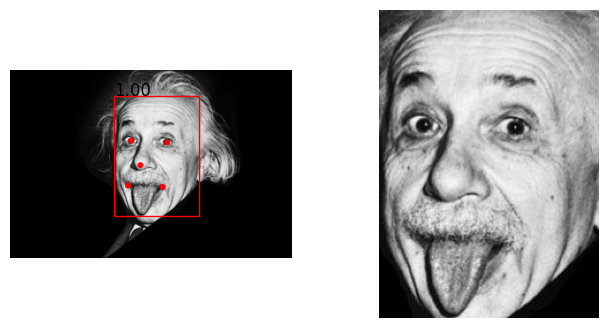

In [20]:
res = draw_box(test_dir + 'albert-einstein.jpg')

1/1 [==============================] - 0s 81ms/step


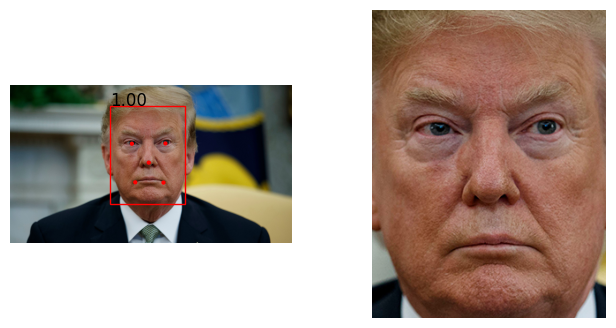

1/1 [==============================] - 0s 263ms/step


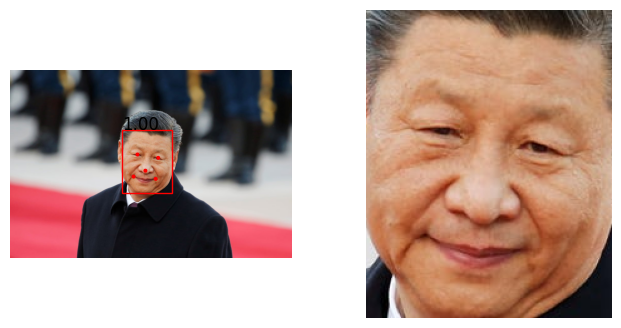

1/1 [==============================] - 0s 104ms/step


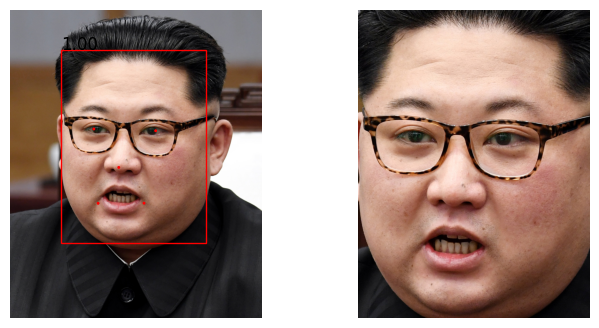

In [21]:
for img in os.listdir(test_dir)[:3]:
    draw_box(test_dir + img)

**Process Cropping For All test Faces**

In [22]:
from tqdm import tqdm
import shutil
if os.path.exists(test_processed_dir):
    shutil.rmtree(test_processed_dir)
os.mkdir(test_processed_dir)
for img in tqdm(os.listdir(test_dir)):
    box = detect_face(test_dir+img)
    im = plt.imread(test_dir+img)
    cropped = crop_img(im, *box['box'])
    plt.imsave(test_processed_dir+img, crop_img(im, *box['box']))

  0%|          | 0/10 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 1/10 [00:01<00:10,  1.22s/it]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 2/10 [00:02<00:09,  1.24s/it]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 3/10 [00:04<00:11,  1.58s/it]

1/1 [==============================] - 0s 117ms/step


 40%|████      | 4/10 [00:06<00:10,  1.76s/it]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 5/10 [00:07<00:06,  1.38s/it]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 6/10 [00:08<00:06,  1.51s/it]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 7/10 [00:11<00:05,  1.77s/it]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 8/10 [00:16<00:05,  2.83s/it]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 9/10 [00:18<00:02,  2.77s/it]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 10/10 [00:20<00:00,  2.05s/it]


**Process Cropping For All train Faces**

In [23]:
def cut_negative_boundary(box):
    res = []
    for x in box['box']:
        if x < 0:
            x = 0
        res.append(x)
    box['box'] = res
    return box

In [24]:
from tqdm import tqdm
import shutil
if os.path.exists(train_processed_dir):
    shutil.rmtree(train_processed_dir)
os.mkdir(train_processed_dir)

for img in tqdm(os.listdir(train_dir)):
    try:
        box = detect_face(train_dir+img)
        box = cut_negative_boundary(box)
        im = plt.imread(train_dir+img)
        cropped = crop_img(im, *box['box'])
        plt.imsave(train_processed_dir+img, cropped)
    except:
        print(img)
        continue

 30%|██▉       | 460/1544 [00:00<00:00, 4561.22it/s]

298066.jpg
298141.jpg
293015.jpg
293983.jpg
303929.jpg
295745.jpg
295313.jpg
296796.jpg
297465.jpg
302655.jpg
304385.jpg
302141.jpg
289784.jpg
301668.jpg
296932.jpg
298104.jpg
293581.jpg
293591.jpg
297000.jpg
297414.jpg
304392.jpg
295629.jpg
297473.jpg
295335.jpg
302076.jpg
296827.jpg
292781.jpg
295859.jpg
300057.jpg
298248.jpg
300662.jpg
294769.jpg
295470.jpg
304160.jpg
296719.jpg
297946.jpg
304449.jpg
303206.jpg
301288.jpg
298154.jpg
304848.jpg
303951.jpg
294173.jpg
294840.jpg
281182.jpg
292688.jpg
294627.jpg
304630.jpg
304086.jpg
297492.jpg
302101.jpg
296174.jpg
295016.jpg
304457.jpg
296268.jpg
295273.jpg
298147.jpg
296657.jpg
304179.jpg
303974.jpg
298233.jpg
286715.jpg
303646.jpg
300414.jpg
303522.jpg
304611.jpg
297160.jpg
302998.jpg
301696.jpg
296008.jpg
299681.jpg
296536.jpg
293546.jpg
295412.jpg
297949.jpg
296670.jpg
300683.jpg
285439.jpg
302464.jpg
292626.jpg
295345.jpg
298038.jpg
297161.jpg
297724.jpg
294212.jpg
298096.jpg
301077.jpg
294074.jpg
297139.jpg
304219.jpg
301658.jpg

 59%|█████▉    | 917/1544 [00:00<00:00, 3744.46it/s]


299845.jpg
296359.jpg
297979.jpg
299592.jpg
302852.jpg
298077.jpg
304891.jpg
295154.jpg
300462.jpg
304470.jpg
304032.jpg
294686.jpg
297037.jpg
288444.jpg
296689.jpg
304889.jpg
304619.jpg
295666.jpg
300630.jpg
304718.jpg
290915.jpg
304200.jpg
289685.jpg
297398.jpg
296013.jpg
303612.jpg
292155.jpg
297678.jpg
293971.jpg
303875.jpg
301985.jpg
295693.jpg
297619.jpg
296885.jpg
303565.jpg
303476.jpg
296019.jpg
294606.jpg
304845.jpg
304105.jpg
291675.jpg
303354.jpg
297877.jpg
296042.jpg
293345.jpg
298089.jpg
296397.jpg
301898.jpg
292606.jpg
304738.jpg
301335.jpg
282214.jpg
304842.jpg
295257.jpg
304609.jpg
297125.jpg
300930.jpg
291027.jpg
297808.jpg
298005.jpg
298128.jpg
298054.jpg
295954.jpg
304862.jpg
297140.jpg
304524.jpg
295143.jpg
288421.jpg
304068.jpg
294888.jpg
296996.jpg
300591.jpg
295819.jpg
304445.jpg
285997.jpg
304070.jpg
294117.jpg
303263.jpg
295582.jpg
302864.jpg
302567.jpg
304731.jpg
297354.jpg
294400.jpg
295139.jpg
296817.jpg
302327.jpg
303343.jpg
301920.jpg
295436.jpg
304711.jp

100%|██████████| 1544/1544 [00:00<00:00, 2762.75it/s]

304035.jpg
295578.jpg
295486.jpg
303460.jpg
299856.jpg
304880.jpg
304043.jpg
298058.jpg
303486.jpg
297142.jpg
297430.jpg
303482.jpg
291931.jpg
288586.jpg
297851.jpg
304218.jpg
298105.jpg
304878.jpg
304864.jpg
302204.jpg
302833.jpg
295331.jpg
302557.jpg
297129.jpg
303210.jpg
302610.jpg
303102.jpg
296915.jpg
296152.jpg
296636.jpg
296698.jpg
293256.jpg
296020.jpg
296282.jpg
303401.jpg
300029.jpg
304383.jpg
295218.jpg
288892.jpg
303096.jpg
303155.jpg
304422.jpg
301222.jpg
295512.jpg
291530.jpg
293167.jpg
297749.jpg
279426.jpg
296160.jpg
292728.jpg
302021.jpg
301080.jpg
296162.jpg
295376.jpg
295117.jpg
299300.jpg
300719.jpg
302888.jpg
296968.jpg
294283.jpg
296305.jpg
300321.jpg
296134.jpg
297561.jpg
294351.jpg
298165.jpg
297471.jpg
289448.jpg
302871.jpg
303291.jpg
302158.jpg
292132.jpg
304571.jpg
304813.jpg
302445.jpg
301851.jpg
292194.jpg
295535.jpg
303887.jpg
304366.jpg
299450.jpg
294767.jpg
296392.jpg
295753.jpg
293637.jpg
296700.jpg
297441.jpg
296211.jpg
297909.jpg
298045.jpg
292679.jpg

In [25]:
mode = 'train' #'train' or 'predict'
model_type = 'vgg16'
model_tag = 'base'
model_id = '{:s}_{:s}'.format(model_type, model_tag)
model_dir = './saved_model/model_{:s}.h5'.format(model_id)
bs = 8
epochs = 2
freeze_backbone = True # True => transfer learning; False => train from scratch

In [26]:
import sys
sys.path.append('/content/drive/MyDrive/1. iNeuron Intelligence Pvt Ltd/Domains/1. Health Care/1. BMI using Human Face Image/Data Set/script')



In [ ]:
pip install keras_vggface

In [27]:
# Most Recent One (Suggested)
!pip install git+https://github.com/rcmalli/keras-vggface.git


  Cloning https://github.com/rcmalli/keras-vggface.git to /tmp/pip-req-build-rxd_ea9v
  Running command git clone --filter=blob:none --quiet https://github.com/rcmalli/keras-vggface.git /tmp/pip-req-build-rxd_ea9v
  Resolved https://github.com/rcmalli/keras-vggface.git to commit bee35376e76e35d00aeec503f2f242611a97b38a
  Preparing metadata (setup.py) ... done


In [28]:
!pip install 'keras==2.1.6' --force-reinstall

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 339.6/339.6 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 57.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.3/36.3 MB 20.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 705.5/705.5 kB 44.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 75.5 MB/s eta 0:00:00
  Attempting uninstall: six
    Found existing installation: six 1.16.0
    Uninstalling six-1.16.0:
      Successfully uninstalled six-1.16.0
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0.1
    Uninstalling PyYAML-6.0.1:
      Successfully uninstalled PyYAML-6.0.1
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.5
    Uninstalling numpy-1.23.5:
      Successfully uninstalled numpy-1.23.5
  Attempting uninstall: scipy
    Found existing installation: scipy 1.10.1
    Uninstalling scipy-1.10.1:
      Successfully uninstalled scipy-1.10.1


In [29]:
import tensorflow.python.keras.engine

**Face detection**

**VGG16 Model**

In [30]:
# keras vggface model
import tensorflow as tf
from tensorflow.keras.models import Model
from keras.layers import Flatten, Dense, Input, Dropout, Activation, BatchNormalization
from keras.utils.layer_utils import get_source_inputs
from keras_vggface.vggface import VGGFace
from keras_vggface import utils
import keras.utils as image

# image manipulation
from matplotlib import pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import cv2

# face alignment
from mtcnn.mtcnn import MTCNN

# model metrics
from sklearn.metrics import roc_auc_score
from sklearn.metrics import mean_squared_error, mean_absolute_error
from scipy.stats import pearsonr

# common packages
import os
import numpy as np
import pandas as pd

In [31]:
def rmse(x,y):
    return np.sqrt(mean_squared_error(x,y))

def mae(x,y):
    return mean_absolute_error(x,y)

def cor(x,y):
    return pearsonr(x,y)[0]

def auc(label, pred):
    return roc_auc_score(label, pred)

def imgs2arr(img_names, img_dir, version = 1):
    """ convert images to mutli-dimensional array
    Args:
        @img_names: image names (e.g. [pic001.png])
        @img_dir: directory of the images (e.g. ./tmp)
        @version: for vggface model preprocessing
    Return:
        np.array
    """
    imgs = []
    for img in img_names:
        imgs += [img2arr(os.path.join(img_dir,img), version)]
    return np.concatenate(imgs)

def process_arr(arr, version):
    """process array (resize, mean-substract)
    Args:
        @arr: np.array
    Return:
        np.array
    """
    img = cv2.resize(arr, (224, 224))
    img = np.expand_dims(img, 0)
    img = utils.preprocess_input(img, version = version)
    return img

def img2arr(img_path, version):
    """convert single image to array
    Args:
        @img_path: full path of the image (e.g. ./tmp/pic001.png)
    Return:
        np.array
    """
    img = image.load_img(img_path)
    img = image.img_to_array(img)
    img = process_arr(img, version)
    return img

def crop_img(im,x,y,w,h):
    return im[y:(y+h),x:(x+w),:]

def input_generator(data, bs, img_dir, is_train = True, version = 1):
    """data input pipeline
    Args:
    @data: dataframe
    @bs: batch size
    @img_dir: dir of saved images
    @is_train: train/valid [sample] or test [sequential]
    """
    sex_map = {'Male':1, 'Female':0}
    loop = True

    while loop:
        if is_train:
            sampled = data.sample(bs)
            x = imgs2arr(sampled['index'],img_dir, version)
            y = [sampled['bmi'].values, sampled['age'].values, sampled['sex'].map(lambda i: sex_map.get(i,0)).values]
            res = (x,y)
        else:
            if len(data) >= bs:
                sampled = data.iloc[:bs,:]
                data = data.iloc[bs:,:]
                res = imgs2arr(sampled['index'],img_dir, version)
            else:
                loop = False
        yield res

class FacePrediction(object):

    def __init__(self, img_dir, model_type = 'vgg16', sex_thresh = 0.05):
        self.model_type = model_type
        self.img_dir = img_dir
        self.detector = MTCNN()
        self.sex_thresh = sex_thresh
        if model_type in ['vgg16','vgg16_fc6']:
            self.version = 1
        else:
            self.version = 2

    def define_model(self, hidden_dim = 128, drop_rate=0.0, freeze_backbone = True):

        if self.model_type == 'vgg16_fc6':
            vgg_model = VGGFace(model = 'vgg16', include_top=True, input_shape=(224, 224, 3))
            last_layer = vgg_model.get_layer('fc6').output
            flatten = Activation('relu')(last_layer)
        else:
            vgg_model = VGGFace(model = self.model_type, include_top=False, input_shape=(224, 224, 3))
            last_layer = vgg_model.output
            flatten = Flatten()(last_layer)

        if freeze_backbone:
            for layer in vgg_model.layers:
                layer.trainable = False

        def block(flatten, name):
            x = Dense(hidden_dim, name=name + '_fc1')(flatten)
            x = BatchNormalization(name = name + '_bn1')(x)
            x = Activation('relu', name = name+'_act1')(x)
            x = Dropout(drop_rate)(x)
            x = Dense(hidden_dim, name=name + '_fc2')(x)
            x = BatchNormalization(name = name + '_bn2')(x)
            x = Activation('relu', name = name+'_act2')(x)
            x = Dropout(drop_rate)(x)
            return x

        x = block(flatten, name = 'bmi')
        out_bmi = Dense(1, activation='linear', name='bmi')(x)

        x = block(flatten, name = 'age')
        out_age = Dense(1, activation='linear', name='age')(x)

        x = block(flatten, name = 'sex')
        out_sex = Dense(1, activation = 'sigmoid', name = 'sex')(x)

        custom_vgg_model = Model(vgg_model.input, [out_bmi, out_age, out_sex])
        custom_vgg_model.compile('adam',
                                 {'bmi':'mae','age':'mae','sex':'binary_crossentropy'},
                                 {'sex': 'accuracy'},
                                 loss_weights={'bmi': 0.8, 'age':0.1, 'sex':0.1})

        self.model = custom_vgg_model


    def train(self, train_data, valid_data, bs, epochs, callbacks):
        train_gen = input_generator(train_data, bs, self.img_dir, True, self.version)
        valid_gen = input_generator(valid_data, bs, self.img_dir, True, self.version)
        self.model.fit_generator(train_gen, len(train_data) // bs, epochs,
                                 validation_data = valid_gen,
                                 validation_steps = len(valid_data) //  bs,
                                 callbacks=callbacks)

    def evaulate(self, valid_data):
        imgs = valid_data['index'].values
        arr = imgs2arr(imgs, self.img_dir, self.version)
        bmi, age, sex = self.model.predict(arr)
        metrics = {'bmi_mae':mae(bmi[:,0], valid_data.bmi.values),
                   'bmi_cor':cor(bmi[:,0], valid_data.bmi.values),
                   'age_mae':mae(age[:,0], valid_data.age.values),
                   'sex_auc':auc(valid_data.gender, sex[:,0])}
        return metrics

    def save_weights(self, model_dir):
        self.model.save_weights(model_dir)

    def load_weights(self, model_dir):
        self.model.load_weights(model_dir)

    def detect_faces(self, face_path, confidence):
        img = image.load_img(face_path)
        img = image.img_to_array(img)
        box = self.detector.detect_faces(img)
        box = [i for i in box if i['confidence'] > confidence]
        res = [crop_img(img, *i['box']) for i in box]
        res = [process_arr(i, self.version) for i in res]
        return box, res

    def predict(self, img_dir, show_img = False):
        if os.path.isdir(img_dir):
            imgs = os.listdir(img_dir)
            arr = imgs2arr(imgs, img_dir, self.version)
        else:
            arr = img2arr(img_dir, self.version)
        preds = self.model.predict(arr)

        if show_img and os.path.isdir(img_dir):
            bmi, age, sex = preds
            num_plots = len(imgs)
            ncols = 5
            nrows = int((num_plots - 0.1) // ncols + 1)
            fig, axs = plt.subplots(nrows, ncols)
            fig.set_size_inches(3 * ncols, 3 * nrows)
            for i, img in enumerate(imgs):
                col = i % ncols
                row = i // ncols
                axs[row, col].imshow(plt.imread(os.path.join(img_dir,img)))
                axs[row, col].axis('off')
                axs[row, col].set_title('BMI: {:3.1f} AGE: {:02.0f} SEX: {:2.1f}'.format(bmi[i,0], age[i,0], sex[i,0]), fontsize = 10)

        return preds

    def predict_df(self, img_dir):
        assert os.path.isdir(img_dir), 'input must be directory'
        fnames = os.listdir(img_dir)
        bmi, age, sex = self.predict(img_dir)
        res = pd.DataFrame({'img':fnames, 'bmi':bmi[:,0], 'age':age[:,0], 'sex':sex[:,0]})
        res['sex_prob'] = res['sex']
        res['sex'] = res['sex'].map(lambda i: 'Male' if i > self.sex_thresh else 'Female')

        return res

    def predict_faces(self, img_path, show_img = True, color = "white", fontsize = 12,
                      confidence = 0.95, fig_size = (16,12)):

        assert os.path.isfile(img_path), 'only single image is supported'
        img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        boxes, faces = self.detect_faces(img_path, confidence)
        preds = [self.model.predict(face) for face in faces]

        if show_img:
            # Create figure and axes
            num_box = len(boxes)
            fig,ax = plt.subplots()
            fig.set_size_inches(fig_size)
            # Display the image
            ax.imshow(img)
            ax.axis('off')
            # Create a Rectangle patch
            for idx, box in enumerate(boxes):
                bmi, age, sex = preds[idx]
                box_x, box_y, box_w, box_h = box['box']
                rect = patches.Rectangle((box_x, box_y), box_w, box_h, linewidth=1,edgecolor='r',facecolor='none')
                ax.add_patch(rect)
                ax.text(box_x, box_y,
                        'BMI:{:3.1f}\nAGE:{:02.0f}\nSEX:{:s}'.format(bmi[0,0], age[0,0], 'M' if sex[0,0] > self.sex_thresh else 'F'),
                       color = color, fontsize = fontsize)
            plt.show()

        return preds

In [37]:
import pandas as pd
import os
import json
from keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
%matplotlib inline
from matplotlib import pyplot as plt
import seaborn as sns
from pathlib import Path
#from scripts.models import FacePrediction
#from scripts import FacePrediction

import glob

allimages = os.listdir('/content/face_aligned')
train = pd.read_csv('/content/drive/MyDrive/1. iNeuron Intelligence Pvt Ltd/Domains/1. Health Care/1. BMI using Human Face Image/Data Set/train.csv')
valid = pd.read_csv('/content/drive/MyDrive/1. iNeuron Intelligence Pvt Ltd/Domains/1. Health Care/1. BMI using Human Face Image/Data Set/valid.csv')

train = train.loc[train['index'].isin(allimages)]
valid = valid.loc[valid['index'].isin(allimages)]



In [33]:
# create metrics, model dirs
Path('./metrics').mkdir(parents = True, exist_ok = True)
Path('./saved_model').mkdir(parents = True, exist_ok = True)



In [38]:
data = pd.concat([train, valid])
data[['age','race','sex','bmi','index']].head()



,age,race,sex,bmi,index
0,24,White,Male,42.825039,263711.jpg
1,21,Black,Male,23.028211,270020.jpg
2,29,White,Male,29.529925,277774.jpg
3,18,White,Male,19.005974,279426.jpg
4,23,Asian,Male,28.889081,279799.jpg


<ipython-input-39-029585a725d3>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.age,  bins = 30, kde=False, color=color, ax = axs[1])
<ipython-input-39-029585a725d3>:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.bmi,  bins = 30, kde=False, color=color, ax = axs[2])


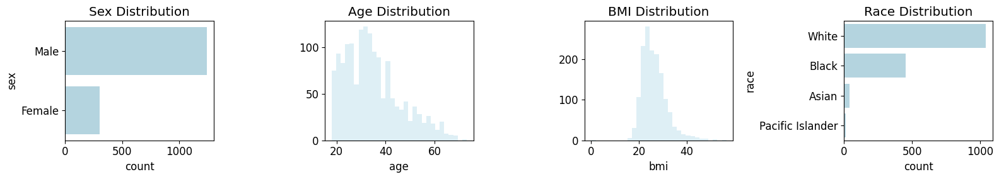

In [39]:
color = 'lightblue'
fig, axs = plt.subplots(1,4)
fig.set_size_inches((16, 3))
sns.countplot(y = data.sex, color = color, ax = axs[0])
axs[0].set_title('Sex Distribution')
sns.distplot(data.age,  bins = 30, kde=False, color=color, ax = axs[1])
axs[1].set_title('Age Distribution')
sns.distplot(data.bmi,  bins = 30, kde=False, color=color, ax = axs[2])
axs[2].set_title('BMI Distribution')
sns.countplot(y = data.race, color = color, ax = axs[3])
axs[3].set_title('Race Distribution')
plt.tight_layout()



In [40]:
def sns_hist(data, x, hue, ax = None, title = 'title', xlabel = None, **kwargs):

    xlabel = x.upper() if xlabel == None else xlabel

    group = data[hue].unique()
    for g in group:
        sns.distplot(data.loc[data[hue] == g, x], label = g, ax = ax,  **kwargs)
    if ax == None:
        plt.legend()
        plt.title(title)
        plt.xlabel(xlabel)
    else:
        ax.legend()
        ax.set_title(title)
        ax.set_xlabel(xlabel)
    return ax



<ipython-input-40-1862c6667fd4>:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.loc[data[hue] == g, x], label = g, ax = ax,  **kwargs)
<ipython-input-40-1862c6667fd4>:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.loc[data[hue] == g, x], label = g, ax = ax,  **kwargs)
<ipython-input

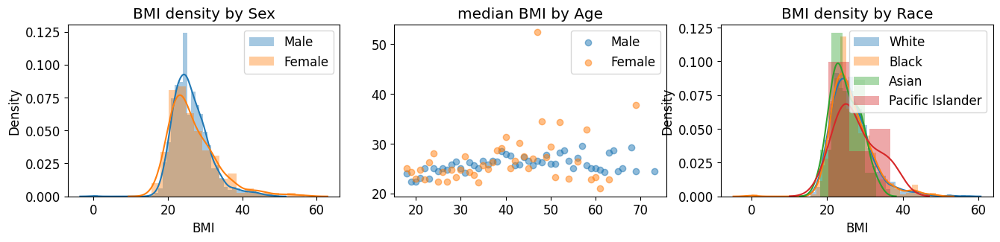

In [41]:
fig, axs = plt.subplots(1,3)
fig.set_size_inches((16, 3))

sns_hist(data, x = 'bmi', hue = 'sex', ax = axs[0], title = 'BMI density by Sex', kde = True)

res = data.groupby(['age','sex'], as_index=False)['bmi'].median()
for i in ['Male','Female']:
    axs[1].scatter(res.loc[res.sex == i,'age'].values, res.loc[res.sex == i,'bmi'].values,label = i, alpha = 0.5)
axs[1].set_title('median BMI by Age')
axs[1].legend()

sns_hist(data, x = 'bmi', hue = 'race', ax = axs[2], title = 'BMI density by Race', kde = True)

plt.show()

**Model Training**

In [42]:
es = EarlyStopping(patience=3)
ckp = ModelCheckpoint(model_dir, save_best_only=True, save_weights_only=True, verbose=1)
tb = TensorBoard('./tb/%s'%(model_id))
callbacks = [es, ckp]

model = FacePrediction(img_dir = '/content/face_aligned', model_type = model_type)
model.define_model(freeze_backbone = freeze_backbone)
model.model.summary()
if mode == 'train':
  model_history = model.train(train, valid, bs = bs, epochs = epochs, callbacks = callbacks)
else:
  model.load_weights(model_dir)



58909280/58909280 [==============================] - 1s 0us/step
Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_1 (Conv2D)               (None, 224, 224, 64  1792        ['input_7[0][0]']                
                                )                                                                 
                                                                                                  
 conv1_2 (Conv2D)               (None, 224, 224, 64  36928       ['conv1_1[0][0]']                
                           

<ipython-input-31-a8b9406b99aa>:139: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  self.model.fit_generator(train_gen, len(train_data) // bs, epochs,
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: Unable to locate the source code of <bound method _BaseOptimizer._update_step_xla of <tensorflow.python.eager.polymorphic_function.tracing_compiler.TfMethodTarget object at 0x7d908c17e560>>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: Unable to locate the source code of <bound method _BaseOptimizer._update_step_xla of <tensorflow.python.eager.polymorphic_function.tracing_compiler.TfMethodTarget object at 0x7d908c17e560>>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
149/149 [==============================] - ETA: 0s - loss: 19.8838 - bmi_loss: 21.1179 - age_loss: 29.7329 - sex_loss: 0.1612 - sex_accuracy: 0.9404

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert

Epoch 1: val_loss improved from inf to 10.74470, saving model to ./saved_model/model_vgg16_base.h5
149/149 [==============================] - 23s 90ms/step - loss: 19.8838 - bmi_loss: 21.1179 - age_loss: 29.7329 - sex_loss: 0.1612 - sex_accuracy: 0.9404 - val_loss: 10.7447 - val_bmi_loss: 10.7621 - val_age_loss: 21.2613 - val_sex_loss: 0.0888 - val_sex_accuracy: 0.9709
Epoch 2/2
149/149 [==============================] - ETA: 0s - loss: 7.8978 - bmi_loss: 8.0218 - age_loss: 14.7326 - sex_loss: 0.0709 - sex_accuracy: 0.9773
Epoch 2: val_loss improved from 10.74470 to 5.57040, saving model to ./saved_model/model_vgg16_base.h5
149/149 [===============

**Model Evaluations**

In [43]:
valid['gender'] = valid.sex.map(lambda i: 1 if i == 'Male' else 0)



In [44]:
metrics = model.evaulate(valid)
metrics['model'] = model_type
with open('./metrics/{:s}.json'.format(model_type), 'w') as f:
    json.dump(metrics, f)

metrics = []
for i in glob.glob('./metrics/*.json'):
    with open(i, 'r') as f:
        res = json.load(f)
    metrics.append(res)
metrics = pd.DataFrame(metrics)
metrics['model'] = metrics['model'].apply(lambda i: '* ' + i if i == model_id else i)
metrics.set_index('model').round(3)



11/11 [==============================] - 10s 499ms/step


,bmi_mae,bmi_cor,age_mae,sex_auc
model,,,,
vgg16,6.396,0.278,7.183,0.999


**Predictions**

In [46]:
#predict from a single facial image
model.predict('/content/drive/MyDrive/1. iNeuron Intelligence Pvt Ltd/Domains/1. Health Care/1. BMI using Human Face Image/Data Set/test/test_aligned/xi.jpg')

1/1 [==============================] - 1s 772ms/step


[array([[26.52721]], dtype=float32),
 array([[58.876717]], dtype=float32),
 array([[0.00117109]], dtype=float32)]

1/1 [==============================] - 0s 20ms/step


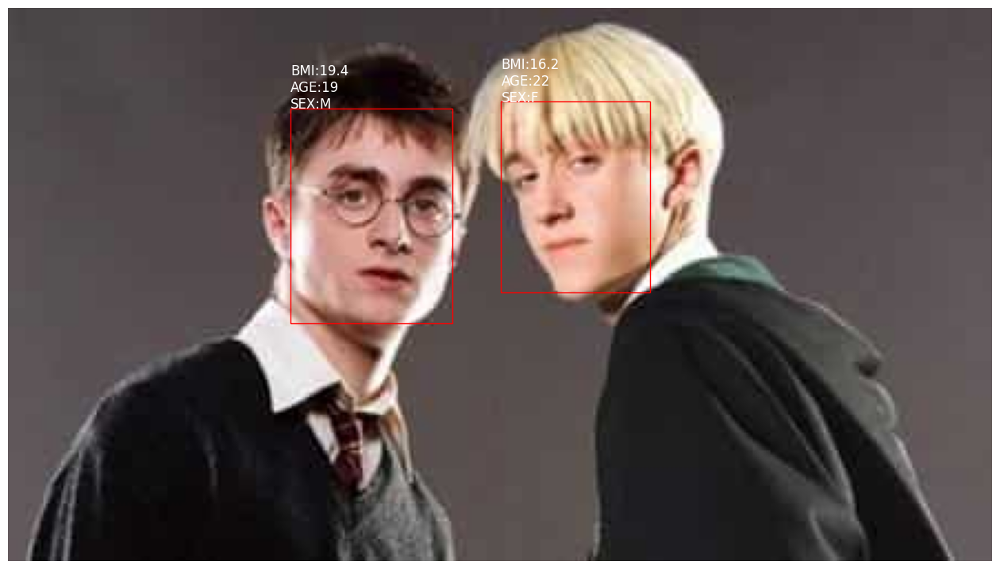

In [47]:
#predict from multiple facial images
preds = model.predict_faces('/content/drive/MyDrive/1. iNeuron Intelligence Pvt Ltd/Domains/1. Health Care/1. BMI using Human Face Image/Data Set/test/multi_face/Harry.jpg', color = 'white')

1/1 [==============================] - 0s 20ms/step


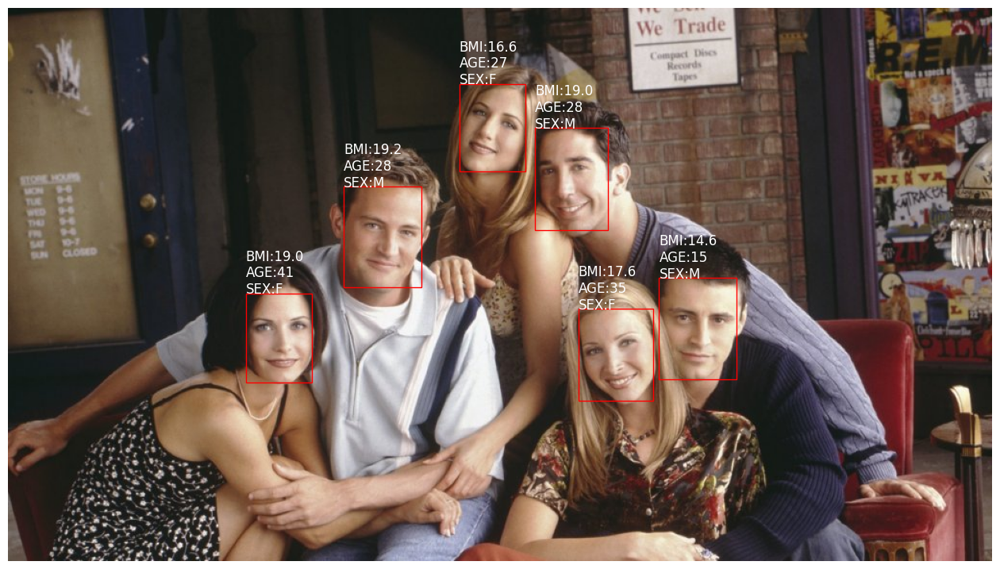

In [48]:
preds = model.predict_faces('/content/drive/MyDrive/1. iNeuron Intelligence Pvt Ltd/Domains/1. Health Care/1. BMI using Human Face Image/Data Set/test/multi_face/friends.jpg', color = 'white')

1/1 [==============================] - 0s 21ms/step


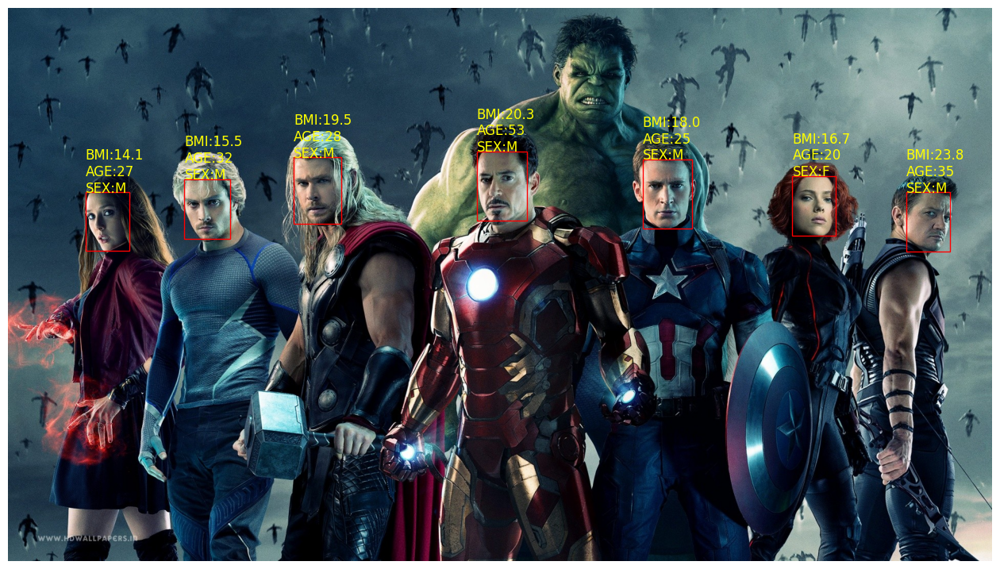

In [49]:
preds = model.predict_faces('/content/drive/MyDrive/1. iNeuron Intelligence Pvt Ltd/Domains/1. Health Care/1. BMI using Human Face Image/Data Set/test/multi_face/avengers.jpg', color = 'yellow')

In [50]:
mode = 'train' #'train' or 'predict'
model_type = 'vgg16'
model_tag = 'seqMT'
model_id = '{:s}_{:s}'.format(model_type, model_tag)
model_dir = './saved_model/model_{:s}.h5'.format(model_id)
bs = 8
epochs = 15
freeze_backbone = True # True => transfer learning; False => train from scratch

In [51]:
import pandas as pd
import os
os.getcwd()
import json
from keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
%matplotlib inline
from matplotlib import pyplot as plt
#from scripts.models import FacePrediction
from pathlib import Path
import glob

allimages = os.listdir('/content/face_aligned')
train = pd.read_csv('/content/drive/MyDrive/1. iNeuron Intelligence Pvt Ltd/Domains/1. Health Care/1. BMI using Human Face Image/Data Set/train.csv')
valid = pd.read_csv('/content/drive/MyDrive/1. iNeuron Intelligence Pvt Ltd/Domains/1. Health Care/1. BMI using Human Face Image/Data Set/valid.csv')

train = train.loc[train['index'].isin(allimages)]
valid = valid.loc[valid['index'].isin(allimages)]

In [52]:
# create metrics, model dirs
Path('./metrics').mkdir(parents = True, exist_ok = True)
Path('./saved_model').mkdir(parents = True, exist_ok = True)



In [53]:
data = pd.concat([train, valid])
data[['age','race','sex','bmi','index']].head()



,age,race,sex,bmi,index
0,24,White,Male,42.825039,263711.jpg
1,21,Black,Male,23.028211,270020.jpg
2,29,White,Male,29.529925,277774.jpg
3,18,White,Male,19.005974,279426.jpg
4,23,Asian,Male,28.889081,279799.jpg


**Modify Model**

In [54]:
# keras vggface model
import tensorflow as tf
from tensorflow.keras.models import Model
from keras.layers import Flatten, Dense, Input, Dropout, Activation, BatchNormalization, Add
from keras.utils.layer_utils import get_source_inputs
from keras_vggface.vggface import VGGFace
from keras_vggface import utils
import keras.utils as image

class FP_MT(FacePrediction):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    def define_model(self, hidden_dim = 128, drop_rate=0.0, freeze_backbone = True):

        if self.model_type == 'vgg16_fc6':
            vgg_model = VGGFace(model = 'vgg16', include_top=True, input_shape=(224, 224, 3))
            last_layer = vgg_model.get_layer('fc6').output
            flatten = Activation('relu')(last_layer)
        else:
            vgg_model = VGGFace(model = self.model_type, include_top=False, input_shape=(224, 224, 3))
            last_layer = vgg_model.output
            flatten = Flatten()(last_layer)

        if freeze_backbone:
            for layer in vgg_model.layers:
                layer.trainable = False

        def block(flatten, name):
            x = Dense(hidden_dim, name=name + '_fc1')(flatten)
            x = BatchNormalization(name = name + '_bn1')(x)
            x = Activation('relu', name = name+'_act1')(x)
            x = Dropout(drop_rate)(x)
            x = Dense(hidden_dim, name=name + '_fc2')(x)
            x = BatchNormalization(name = name + '_bn2')(x)
            x = Activation('relu', name = name+'_act2')(x)
            x = Dropout(drop_rate)(x)
            return x

        x = block(flatten, name = 'sex')
        out_sex = Dense(1, activation = 'sigmoid', name = 'sex')(x)

        # residual connection to age
        x1 = Dense(hidden_dim)(flatten)
        x1 = Add()([x1, x])
        x1 = block(x1, name = 'age')
        out_age = Dense(1, activation='linear', name='age')(x1)

        # residual connection to bmi
        x2 = Dense(hidden_dim)(flatten)
        x2 = Add()([x2, x])
        x2 = block(x2, name = 'bmi')
        out_bmi = Dense(1, activation='linear', name='bmi')(x2)

        custom_vgg_model = Model(vgg_model.input, [out_bmi, out_age, out_sex])
        custom_vgg_model.compile('adam',
                                 {'bmi':'mae','age':'mae','sex':'binary_crossentropy'},
                                 {'sex': 'accuracy'},
                                 loss_weights={'bmi': 0.8, 'age':0.1, 'sex':0.1})

        self.model = custom_vgg_model

**Training**

In [55]:
es = EarlyStopping(patience=3)
ckp = ModelCheckpoint(model_dir, save_best_only=True, save_weights_only=True, verbose=1)
tb = TensorBoard('./tb/%s'%(model_type))
callbacks = [es, ckp, tb]

model = FP_MT(img_dir = '/content/face_aligned', model_type = model_type)
model.define_model(freeze_backbone = freeze_backbone)
model.model.summary()
if mode == 'train':
    model.train(train, valid, bs = bs, epochs = epochs, callbacks = callbacks)
else:
    model.load_weights(model_dir)

Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_1 (Conv2D)               (None, 224, 224, 64  1792        ['input_11[0][0]']               
                                )                                                                 
                                                                                                  
 conv1_2 (Conv2D)               (None, 224, 224, 64  36928       ['conv1_1[0][0]']                
                                )                                                          

<ipython-input-31-a8b9406b99aa>:139: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  self.model.fit_generator(train_gen, len(train_data) // bs, epochs,


Epoch 1/15


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
149/149 [==============================] - ETA: 0s - loss: 19.4891 - bmi_loss: 20.7130 - age_loss: 29.0068 - sex_loss: 0.1801 - sex_accuracy: 0.9362

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert

Epoch 1: val_loss improved from inf to 11.01219, saving model to ./saved_model/model_vgg16_seqMT.h5
149/149 [==============================] - 23s 83ms/step - loss: 19.4891 - bmi_loss: 20.7130 - age_loss: 29.0068 - sex_loss: 0.1801 - sex_accuracy: 0.9362 - val_loss: 11.0122 - val_bmi_loss: 11.1827 - val_age_loss: 20.5922 - val_sex_loss: 0.0684 - val_sex_accuracy: 0.9797
Epoch 2/15
149/149 [==============================] - ETA: 0s - loss: 7.7401 - bmi_loss: 7.7608 - age_loss: 15.2274 - sex_loss: 0.0874 - sex_accuracy: 0.9673
Epoch 2: val_loss improved from 11.01219 to 5.91073, saving model to ./saved_model/model_vgg16_seqMT.h5
149/149 [============

**Evaluations**

In [56]:
metrics = model.evaulate(valid)
metrics['model'] = model_id
with open('./metrics/{:s}.json'.format(model_id), 'w') as f:
    json.dump(metrics, f)
metrics = []
for i in glob.glob('./metrics/*.json'):
    with open(i, 'r') as f:
        res = json.load(f)
    metrics.append(res)
metrics = pd.DataFrame(metrics)
metrics['model'] = metrics['model'].apply(lambda i: '* ' + i if i == model_id else i)
metrics.set_index('model').round(3)

11/11 [==============================] - 2s 127ms/step


,bmi_mae,bmi_cor,age_mae,sex_auc
model,,,,
* vgg16_seqMT,3.751,0.411,5.141,0.998
vgg16,6.396,0.278,7.183,0.999


**Predictions**

In [57]:
#predict from a single facial image
model.predict('/content/drive/MyDrive/1. iNeuron Intelligence Pvt Ltd/Domains/1. Health Care/1. BMI using Human Face Image/Data Set/test/test_aligned/xi.jpg')

1/1 [==============================] - 0s 30ms/step


[array([[30.466845]], dtype=float32),
 array([[61.6214]], dtype=float32),
 array([[0.68655497]], dtype=float32)]

1/1 [==============================] - 0s 18ms/step


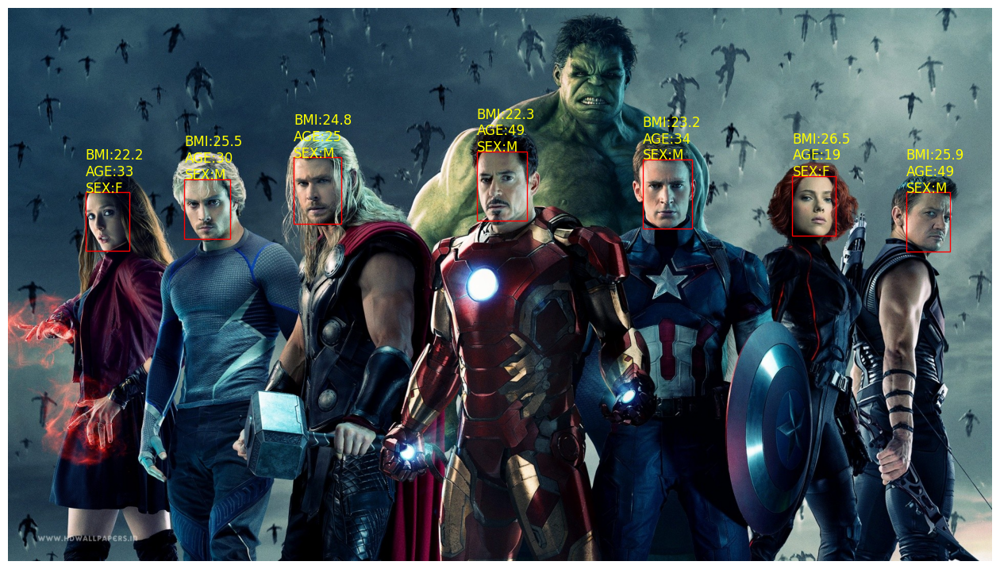

In [58]:
#predict from multiple facial image
preds = model.predict_faces('/content/drive/MyDrive/1. iNeuron Intelligence Pvt Ltd/Domains/1. Health Care/1. BMI using Human Face Image/Data Set/test/multi_face/avengers.jpg', color = 'yellow')

1/1 [==============================] - 0s 21ms/step


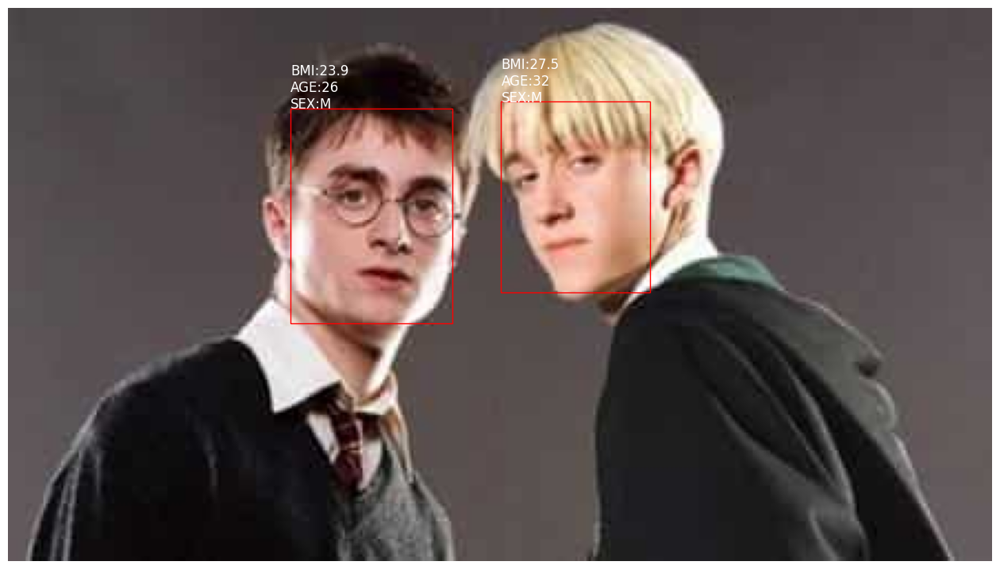

In [59]:
#predict from multiple facial image
preds = model.predict_faces('/content/drive/MyDrive/1. iNeuron Intelligence Pvt Ltd/Domains/1. Health Care/1. BMI using Human Face Image/Data Set/test/multi_face/Harry.jpg', color = 'white')

1/1 [==============================] - 0s 32ms/step


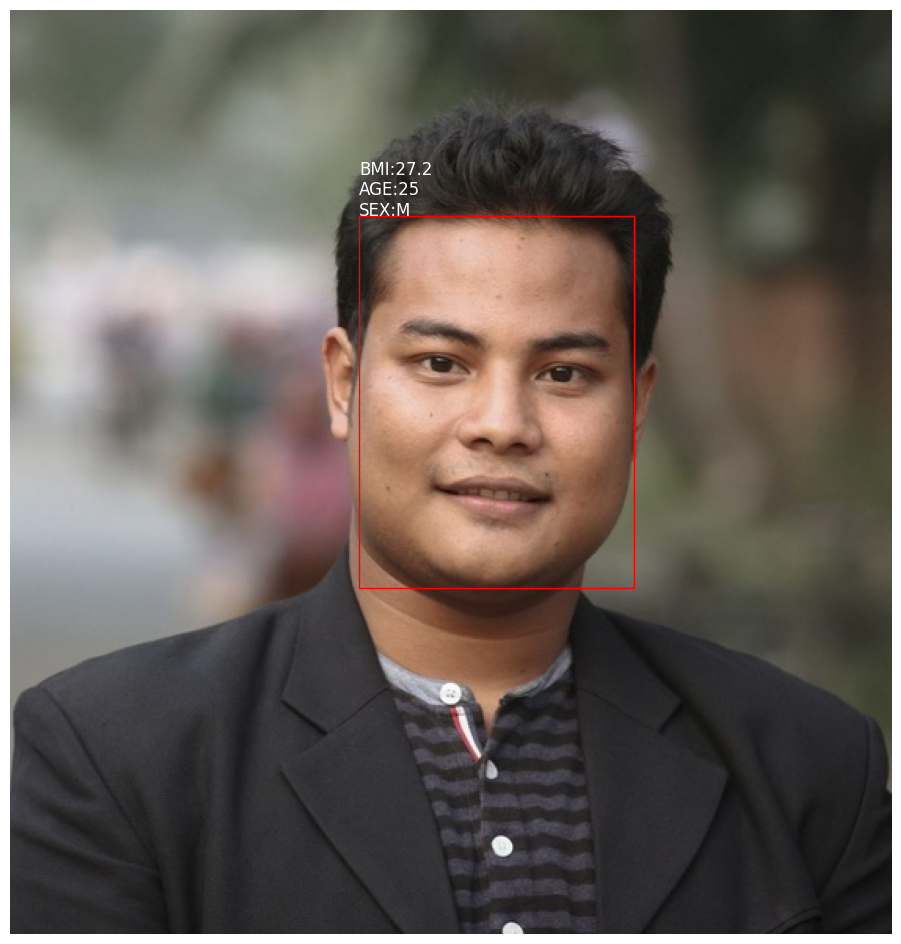

In [60]:
#predict from multiple facial image
preds = model.predict_faces('/content/drive/MyDrive/1. iNeuron Intelligence Pvt Ltd/Domains/1. Health Care/1. BMI using Human Face Image/Data Set/test/multi_face/Manos.jpg', color = 'white')

1/1 [==============================] - 0s 23ms/step


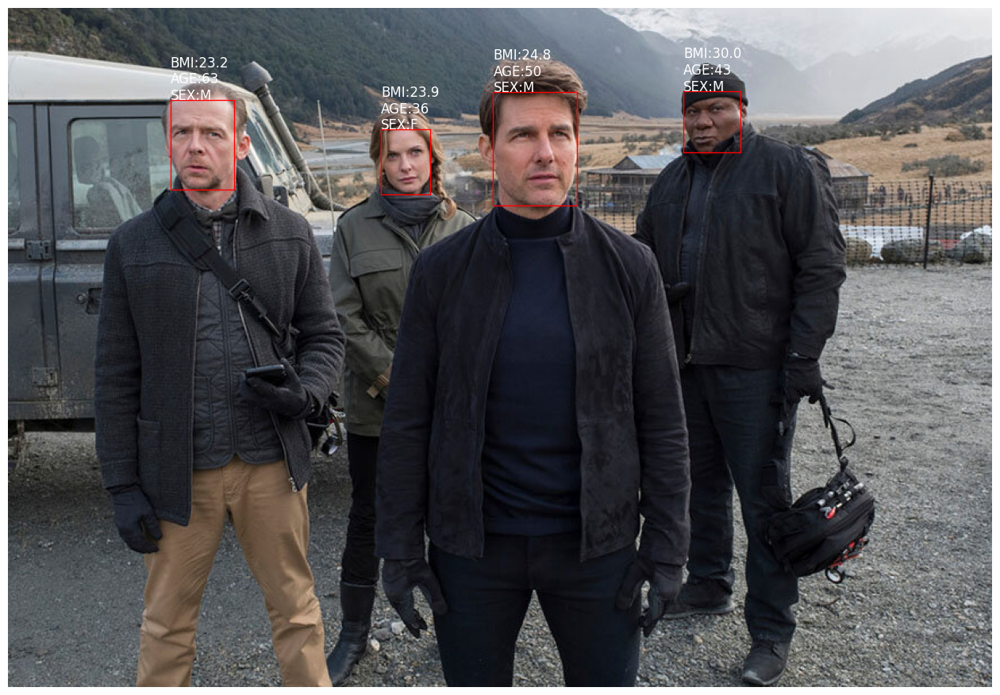

In [61]:
#predict from multiple facial image
preds = model.predict_faces('/content/drive/MyDrive/1. iNeuron Intelligence Pvt Ltd/Domains/1. Health Care/1. BMI using Human Face Image/Data Set/test/multi_face/img01.jpg', color = 'white')

In [62]:
!pip install anvil-uplink



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.1/90.1 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.4/51.4 kB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for ws4py: filename=ws4py-0.5.1-py3-none-any.whl size=45228 sha256=901a54876438783c0358a0089899fd0c41e0e227cb1ad32f2acf6f64d854f8db
  Stored in directory: /root/.cache/pip/wheels/2e/7c/ad/d9c746276bf024d44296340869fcb169f1e5d80fb147351a57
Successfully built ws4py


In [63]:
import anvil.server

anvil.server.connect("server_TBM366NWDJIZMLBWACJINX6R-ZARO63XF2PS27IEY")

Connecting to wss://anvil.works/uplink
Anvil websocket open
Connected to "Published" as SERVER


In [96]:
import anvil.media #To CONNECT TO WEB APP ON ANVIL PLATFORM

@anvil.server.callable

def predict_image(file):

    with anvil.media.TempFile(file) as filename:
        preds = model.predict_faces(filename, color = 'orange')
        #a=anvil.media.from_file(preds, 'image/jpeg')
        sex_thresh = 0.05
        bmi = preds[0][0][0][0]
        age = preds[0][1][0][0]
        sex = preds[0][2][0][0]


    return 'BMI:{:3.1f}\nAGE:{:02.0f}\nSEX:{:s}'.format(bmi, age, 'Male' if sex > sex_thresh else 'Female')

1/1 [==============================] - 0s 22ms/step


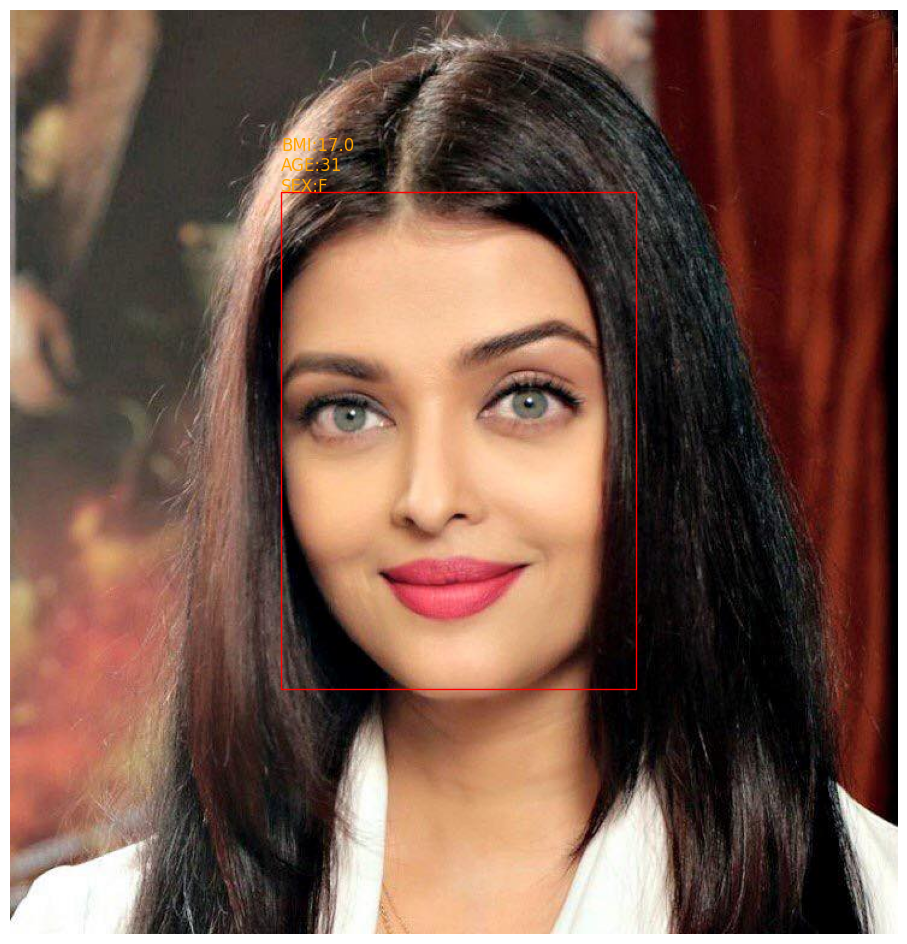

1/1 [==============================] - 0s 19ms/step


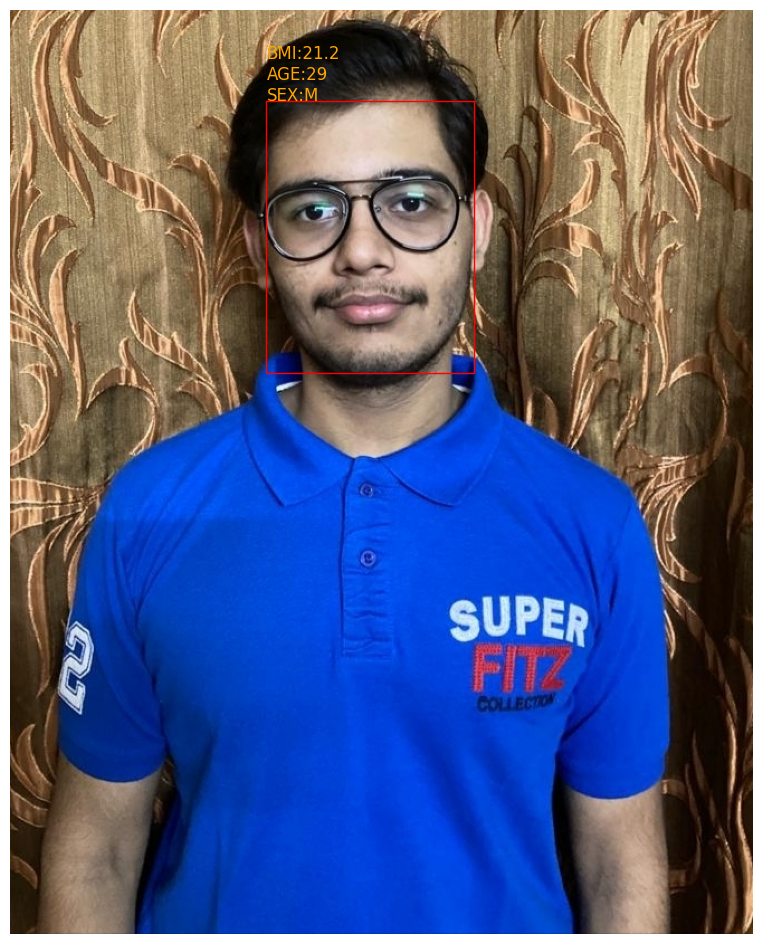

1/1 [==============================] - 0s 27ms/step


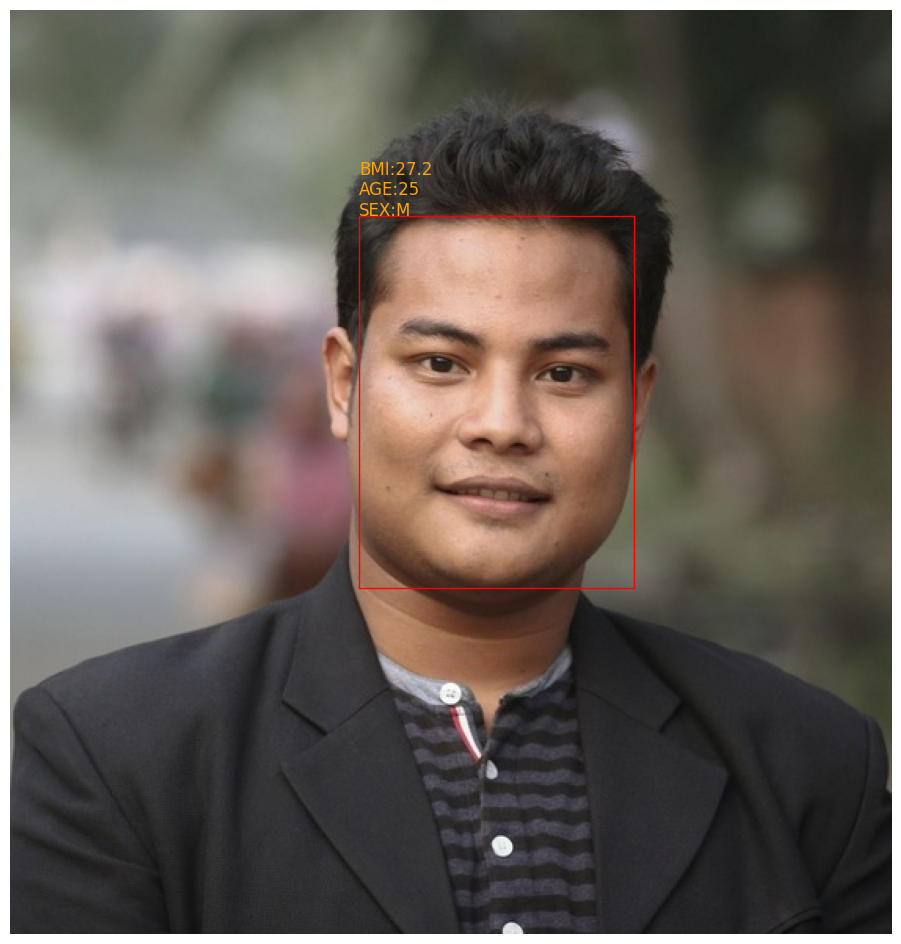

In [ ]:
anvil.server.wait_forever()